# Tugas Analisis Multimedia: **Image (Citra Digital)**

**Mata Kuliah:** Sistem & Teknologi Multimedia  
**Nama:** Muhammad Daffa Rafif Wibowo
**NIM:** 122140036

---

## Deskripsi Tugas

Tugas ini bertujuan untuk memahami **representasi dasar data citra digital (image)** melalui praktik langsung memuat data, visualisasi komponen warna, serta melakukan analisis spasial sederhana menggunakan berbagai teknik dasar pengolahan citra.

Anda akan bekerja dengan satu atau beberapa gambar (foto diri, objek, atau lingkungan sekitar) untuk:

* Mengamati struktur data piksel dan channel warna (RGB, Grayscale, HSV, dsb.)
* Menganalisis perbedaan hasil visualisasi antar representasi warna
* Melakukan eksplorasi sederhana terhadap transformasi citra (cropping, filtering, edge detection, dll.)
* Menyimpulkan pengaruh setiap tahap pemrosesan terhadap persepsi visual

Fokus tugas ini adalah pada **pemahaman konsep representasi spasial citra digital** dan **interpretasi hasil visualisasi**, **bukan** pada manipulasi kompleks atau penerapan model pembelajaran mesin.

### **Soal 1 — Cropping dan Konversi Warna**

* Ambil sebuah gambar diri Anda (*selfie*) menggunakan kamera atau smartphone.



* Lakukan **cropping secara manual** untuk menghasilkan dua potongan:

  * Cropping **kotak persegi pada area wajah**.
  * Cropping **persegi panjang pada area latar belakang**.


Lebar cropping baru: 400
Tinggi cropping: 400


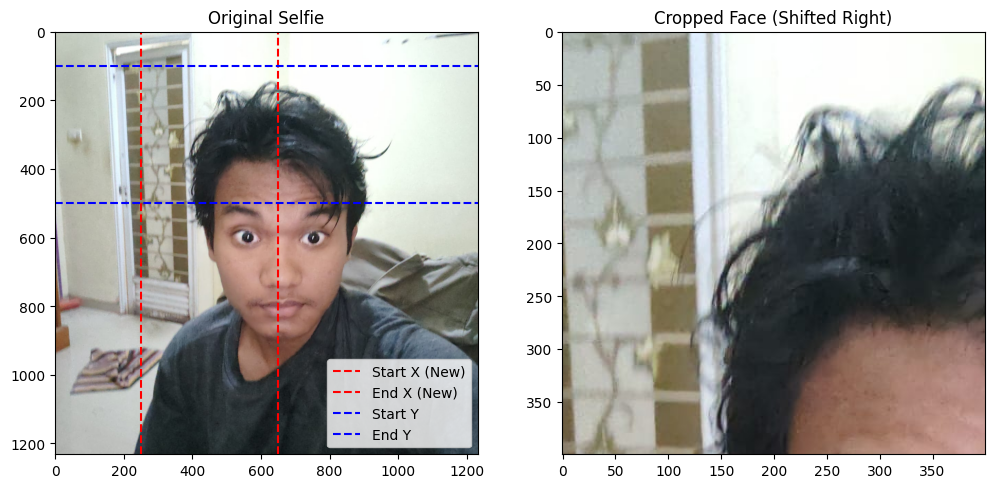

In [11]:
import cv2
import matplotlib.pyplot as plt

# 1. Baca gambar selfie Anda
# Ganti 'selfie.jpg' dengan nama file foto And
img = cv2.imread('selfie.jpg')

# Konversi BGR ke RGB agar warna tampil benar di Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. Tentukan koordinat cropping awal Anda
y_start, y_end = 100, 500
x_start, x_end = 200, 600

# --- Bagian yang diubah: Menggeser cropping ke KANAN ---
# Misal, kita geser 50 pixel ke kanan. Anda bisa ubah nilai 'shift_right' ini.
shift_right = 50

# Sesuaikan koordinat X
x_start_new = x_start + shift_right
x_end_new = x_end + shift_right

# Pastikan area cropping masih persegi setelah digeser
# Kita cek ulang lebar dan tinggi
width = x_end_new - x_start_new
height = y_end - y_start

print(f"Lebar cropping baru: {width}")
print(f"Tinggi cropping: {height}")

if width != height:
    print("Peringatan: Area cropping mungkin tidak lagi persegi setelah pergeseran. Sesuaikan x_start_new/x_end_new atau y_start/y_end jika perlu.")
# --------------------------------------------------------

# 3. Lakukan Cropping dengan koordinat yang sudah digeser
cropped_face = img_rgb[y_start:y_end, x_start_new:x_end_new]

# 4. Tampilkan Hasil
plt.figure(figsize=(12, 6)) # Ukuran figure sedikit lebih besar agar lebih jelas
plt.subplot(1, 2, 1)
plt.title("Original Selfie")
plt.imshow(img_rgb)
plt.axvline(x=x_start_new, color='r', linestyle='--', label='Start X (New)') # Garis bantu
plt.axvline(x=x_end_new, color='r', linestyle='--', label='End X (New)')   # Garis bantu
plt.axhline(y=y_start, color='b', linestyle='--', label='Start Y')   # Garis bantu
plt.axhline(y=y_end, color='b', linestyle='--', label='End Y')     # Garis bantu
plt.legend()


plt.subplot(1, 2, 2)
plt.title("Cropped Face (Shifted Right)")
plt.imshow(cropped_face)
plt.show()

Dimensi Gambar Asli: Lebar=1232, Tinggi=1232

Koordinat Cropping Latar Belakang:
Y: 200 - 400
X: 0 - 300


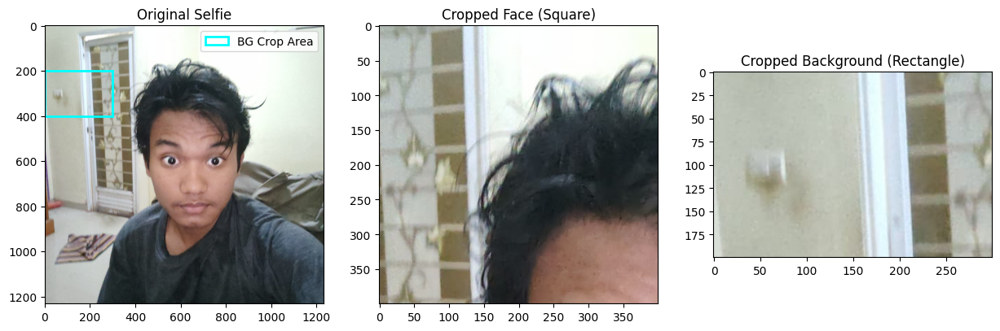

In [13]:
import cv2
import matplotlib.pyplot as plt

# 1. Baca gambar selfie Anda
img = cv2.imread('selfie.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Dapatkan dimensi gambar asli untuk referensi
height_orig, width_orig, _ = img_rgb.shape
print(f"Dimensi Gambar Asli: Lebar={width_orig}, Tinggi={height_orig}")

# -----------------------------------------------------------------
# BAGIAN 1: CROP WAJAH PERSEGI (DARI SEBELUMNYA)
# Koordinat wajah yang sudah disesuaikan (geser 50px ke kanan)
y_start_wajah, y_end_wajah = 100, 500
x_start_wajah, x_end_wajah = 250, 650 # (Asumsi 200+50 dan 600+50)

# Lakukan Cropping Wajah
cropped_face = img_rgb[y_start_wajah:y_end_wajah, x_start_wajah:x_end_wajah]
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 2: CROP LATAR BELAKANG PERSEGI PANJANG (BARU) ✂️
#
# KOORDINAT YANG ANDA MINTA:
y_start_bg = 200
x_start_bg = 0

# Tentukan LEBAR dan TINGGI persegi panjang yang diinginkan dari titik awal tersebut.
# !! Anda bisa mengubah nilai-nilai ini !!
lebar_bg = 300  # Lebar 300 pixel
tinggi_bg = 200 # Tinggi 200 pixel

# Hitung koordinat akhir
y_end_bg = y_start_bg + tinggi_bg
x_end_bg = x_start_bg + lebar_bg

# Pastikan koordinat akhir tidak melebihi dimensi gambar
y_end_bg = min(y_end_bg, height_orig)
x_end_bg = min(x_end_bg, width_orig)

print(f"\nKoordinat Cropping Latar Belakang:")
print(f"Y: {y_start_bg} - {y_end_bg}")
print(f"X: {x_start_bg} - {x_end_bg}")

# Lakukan Cropping Latar Belakang
cropped_background = img_rgb[y_start_bg:y_end_bg, x_start_bg:x_end_bg]
# -----------------------------------------------------------------


# 4. Tampilkan Semua Hasil
plt.figure(figsize=(15, 5))

# Gambar 1: Asli
plt.subplot(1, 3, 1)
plt.title("Original Selfie")
plt.imshow(img_rgb)
# Tambahkan kotak bantu pada gambar asli untuk area background yang di-crop
plt.gca().add_patch(plt.Rectangle((x_start_bg, y_start_bg), x_end_bg - x_start_bg, y_end_bg - y_start_bg,
                                   edgecolor='cyan', facecolor='none', lw=2, label='BG Crop Area'))
plt.legend()

# Gambar 2: Hasil Crop Wajah
plt.subplot(1, 3, 2)
plt.title("Cropped Face (Square)")
plt.imshow(cropped_face)

# Gambar 3: Hasil Crop Latar Belakang
plt.subplot(1, 3, 3)
plt.title("Cropped Background (Rectangle)")
plt.imshow(cropped_background)

plt.show()

* Resize hasil crop menjadi **920×920 piksel**.


Shape Wajah (Sebelum Resize): (400, 400, 3)
Shape Wajah (Sesudah Resize): (920, 920, 3)

Shape Latar Belakang (Sebelum Resize): (200, 300, 3)
Shape Latar Belakang (Sesudah Resize): (920, 920, 3)


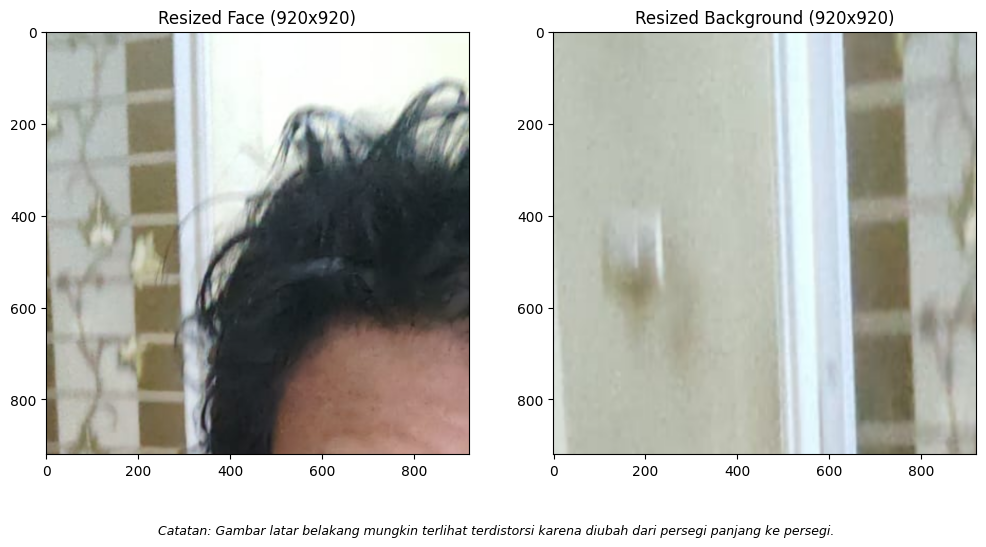

In [14]:
import cv2
import matplotlib.pyplot as plt

# 1. Baca gambar selfie Anda
img = cv2.imread('selfie.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Dapatkan dimensi gambar asli
height_orig, width_orig, _ = img_rgb.shape

# -----------------------------------------------------------------
# BAGIAN 1: CROP WAJAH PERSEGI (DARI SEBELUMNYA)
y_start_wajah, y_end_wajah = 100, 500
x_start_wajah, x_end_wajah = 250, 650
cropped_face = img_rgb[y_start_wajah:y_end_wajah, x_start_wajah:x_end_wajah]
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 2: CROP LATAR BELAKANG (DARI SEBELUMNYA)
y_start_bg = 200
x_start_bg = 0
lebar_bg = 300
tinggi_bg = 200
y_end_bg = min(y_start_bg + tinggi_bg, height_orig)
x_end_bg = min(x_start_bg + lebar_bg, width_orig)
cropped_background = img_rgb[y_start_bg:y_end_bg, x_start_bg:x_end_bg]
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 3: RESIZE HASIL CROP (BARU) 📐
#
# Tentukan ukuran target.
# Penting: cv2.resize menggunakan format (Lebar, Tinggi)
target_size = (920, 920)

# Gunakan cv2.INTER_LINEAR untuk interpolasi standar (baik untuk memperbesar/memperkecil)
resized_face = cv2.resize(cropped_face, target_size, interpolation=cv2.INTER_LINEAR)
resized_background = cv2.resize(cropped_background, target_size, interpolation=cv2.INTER_LINEAR)
# -----------------------------------------------------------------


# Konfirmasi ukuran baru (shape)
# Shape (Tinggi, Lebar, Channel)
print(f"Shape Wajah (Sebelum Resize): {cropped_face.shape}")
print(f"Shape Wajah (Sesudah Resize): {resized_face.shape}")
print(f"\nShape Latar Belakang (Sebelum Resize): {cropped_background.shape}")
print(f"Shape Latar Belakang (Sesudah Resize): {resized_background.shape}")


# 4. Tampilkan Hasil Resize
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Resized Face (920x920)")
plt.imshow(resized_face)

plt.subplot(1, 2, 2)
plt.title("Resized Background (920x920)")
plt.imshow(resized_background)
plt.figtext(0.5, 0.01, 'Catatan: Gambar latar belakang mungkin terlihat terdistorsi karena diubah dari persegi panjang ke persegi.',
            ha='center', fontsize=9, style='italic')

plt.show()

* Konversi gambar menjadi **grayscale** dan **HSV**, lalu tampilkan ketiganya berdampingan.


Shape Asli (RGB): (920, 920, 3)
Shape Grayscale: (920, 920)
Shape HSV: (920, 920, 3)


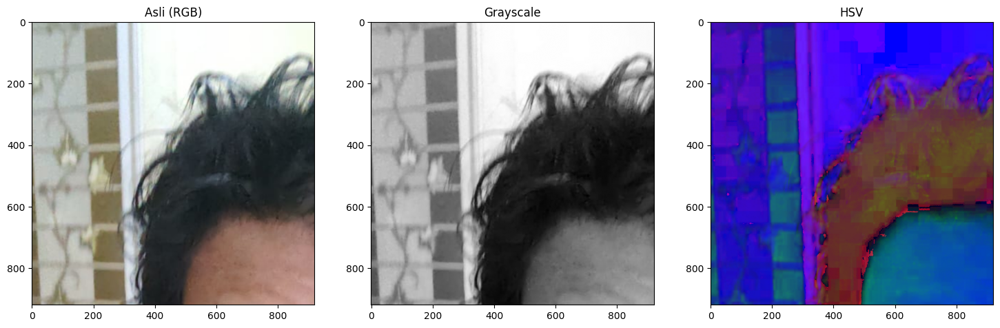

In [15]:
import cv2
import matplotlib.pyplot as plt
import numpy as np # Diperlukan untuk beberapa operasi (meski tidak di-resize)

# 1. Baca gambar selfie Anda
img = cv2.imread('selfie.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
height_orig, width_orig, _ = img_rgb.shape

# -----------------------------------------------------------------
# BAGIAN 1: CROP WAJAH PERSEGI
y_start_wajah, y_end_wajah = 100, 500
x_start_wajah, x_end_wajah = 250, 650
cropped_face = img_rgb[y_start_wajah:y_end_wajah, x_start_wajah:x_end_wajah]

# -----------------------------------------------------------------
# BAGIAN 2: CROP LATAR BELAKANG (Kode ini tetap ada, tapi tidak kita pakai di langkah ini)
y_start_bg = 200
x_start_bg = 0
lebar_bg = 300
tinggi_bg = 200
y_end_bg = min(y_start_bg + tinggi_bg, height_orig)
x_end_bg = min(x_start_bg + lebar_bg, width_orig)
cropped_background = img_rgb[y_start_bg:y_end_bg, x_start_bg:x_end_bg]
# -----------------------------------------------------------------

# -----------------------------------------------------------------
# BAGIAN 3: RESIZE HASIL CROP WAJAH
target_size = (920, 920)
resized_face = cv2.resize(cropped_face, target_size, interpolation=cv2.INTER_LINEAR)
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 4: KONVERSI RUANG WARNA (BARU) 🎨
#
# Ingat: resized_face saat ini dalam format RGB (karena dari Matplotlib)

# Konversi RGB ke Grayscale
gray_face = cv2.cvtColor(resized_face, cv2.COLOR_RGB2GRAY)

# Konversi RGB ke HSV
hsv_face = cv2.cvtColor(resized_face, cv2.COLOR_RGB2HSV)
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 5: TAMPILKAN KETIGA GAMBAR (BARU)
print(f"Shape Asli (RGB): {resized_face.shape}") # Akan (920, 920, 3)
print(f"Shape Grayscale: {gray_face.shape}")    # Akan (920, 920) -> 2 Dimensi
print(f"Shape HSV: {hsv_face.shape}")          # Akan (920, 920, 3)

plt.figure(figsize=(18, 6)) # Dibuat lebih lebar agar muat 3 gambar

# Gambar 1: Asli (RGB)
plt.subplot(1, 3, 1)
plt.title("Asli (RGB)")
plt.imshow(resized_face)

# Gambar 2: Grayscale
plt.subplot(1, 3, 2)
plt.title("Grayscale")
# Penting: Tentukan cmap='gray' agar gambar ditampilkan benar (hitam putih)
plt.imshow(gray_face, cmap='gray')

# Gambar 3: HSV
plt.subplot(1, 3, 3)
plt.title("HSV")
# Tampilan HSV akan terlihat "aneh" jika dilihat langsung,
# ini normal karena channel-nya merepresentasikan Hue, Saturation, Value
plt.imshow(hsv_face)

plt.show()

* Tambahkan **anotasi teks** berisi nama Anda di atas kepala pada gambar hasil crop.



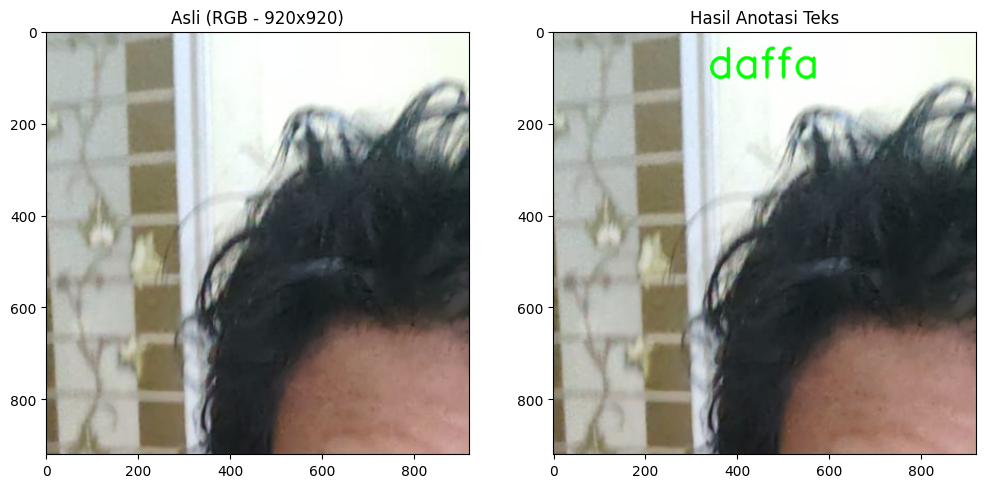

In [16]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# 1. Baca gambar selfie Anda
img = cv2.imread('selfie.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
height_orig, width_orig, _ = img_rgb.shape

# -----------------------------------------------------------------
# BAGIAN 1: CROP WAJAH PERSEGI
y_start_wajah, y_end_wajah = 100, 500
x_start_wajah, x_end_wajah = 250, 650
cropped_face = img_rgb[y_start_wajah:y_end_wajah, x_start_wajah:x_end_wajah]

# -----------------------------------------------------------------
# BAGIAN 2: CROP LATAR BELAKANG (Kode ini tetap ada, tapi tidak kita pakai di langkah ini)
# ... (kode cropping background)
# -----------------------------------------------------------------

# -----------------------------------------------------------------
# BAGIAN 3: RESIZE HASIL CROP WAJAH
target_size = (920, 920)
# Ini gambar asli hasil resize (RGB)
resized_face = cv2.resize(cropped_face, target_size, interpolation=cv2.INTER_LINEAR)
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 4: ANOTASI TEKS (BARU) ✍️
#
# Buat salinan agar gambar asli (resized_face) tidak ikut tercoret
annotated_face = resized_face.copy()

# Tentukan properti teks
text = "daffa"
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 3  # Ukuran font, mungkin perlu disesuaikan
font_color_rgb = (0, 255, 0) # Warna (R, G, B) -> Hijau Terang
thickness = 5 # Ketebalan

# Tentukan posisi (x, y) - (kiri-bawah teks)
# Kita taruh di atas-tengah

# Dapatkan ukuran teks (lebar, tinggi) untuk centering
(text_width, text_height), baseline = cv2.getTextSize(text, font, font_scale, thickness)

# Hitung koordinat X agar teks terpusat (Center)
# (Lebar Gambar - Lebar Teks) / 2
x_pos = (annotated_face.shape[1] - text_width) // 2

# Tentukan koordinat Y (di atas kepala)
# Misal 100 pixel dari atas. (Ini adalah baseline/garis bawah teks)
y_pos = 100

# Tulis teks pada gambar salinan
cv2.putText(annotated_face,
            text,
            (x_pos, y_pos),
            font,
            font_scale,
            font_color_rgb,
            thickness,
            cv2.LINE_AA) # LINE_AA untuk anti-aliasing (lebih halus)
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 5: TAMPILKAN HASIL ANOTASI
plt.figure(figsize=(12, 6))

# Gambar 1: Asli (RGB) - tidak teranotasi
plt.subplot(1, 2, 1)
plt.title("Asli (RGB - 920x920)")
plt.imshow(resized_face)

# Gambar 2: Hasil Anotasi
plt.subplot(1, 2, 2)
plt.title("Hasil Anotasi Teks")
plt.imshow(annotated_face)

plt.show()

 * Gaya teks (font, warna, posisi, ukuran, ketebalan) **dibebaskan**.
* Jelaskan efek **cropping** dan **perubahan warna** menggunakan **Markdown**.

Penjelasan : Oke baik disini saya akan menjelaskan efek cropping berikut dan perubahan warnanya secara singkat efek utamanya yaitu perubahan dimensi yang dimana jumlah pixelnya lebih kecil dari gambar aslinya, selanjutnya kehilangan data yang dimana data piksel diluar area crop itu menghilang secara permanen, dan perubahan fokus dan komposisi, saya diatas mengubah subjek dan komposisi gambarnya.

### **Soal 2 — Manipulasi Channel Warna RGB**

* Gunakan gambar hasil crop dari Soal 1.
* Konversikan gambar ke ruang warna **RGB**.


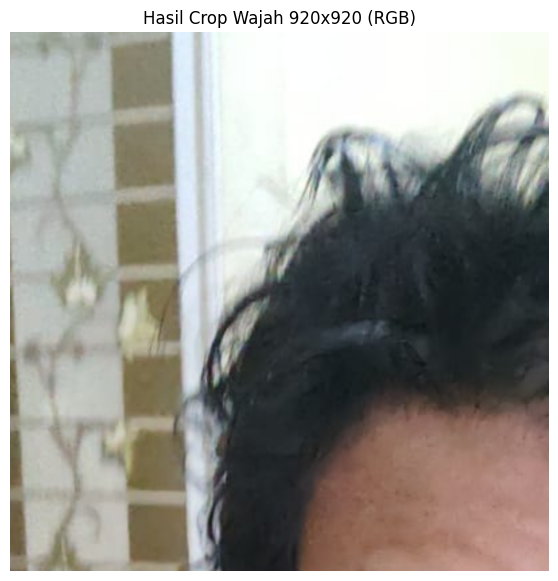

In [17]:
import matplotlib.pyplot as plt

# Asumsi variabel 'resized_face' sudah ada dari Soal 1

# Tampilkan gambar RGB
plt.figure(figsize=(7, 7))
plt.title("Hasil Crop Wajah 920x920 (RGB)")
plt.imshow(resized_face)
plt.axis('off') # Menghilangkan sumbu X dan Y
plt.show()


* Lakukan manipulasi channel warna dengan cara:

  * **Naikkan intensitas channel merah sebanyak 50 poin** (maksimum 255).
  * **Turunkan intensitas channel biru sebanyak 30 poin** (minimum 0).


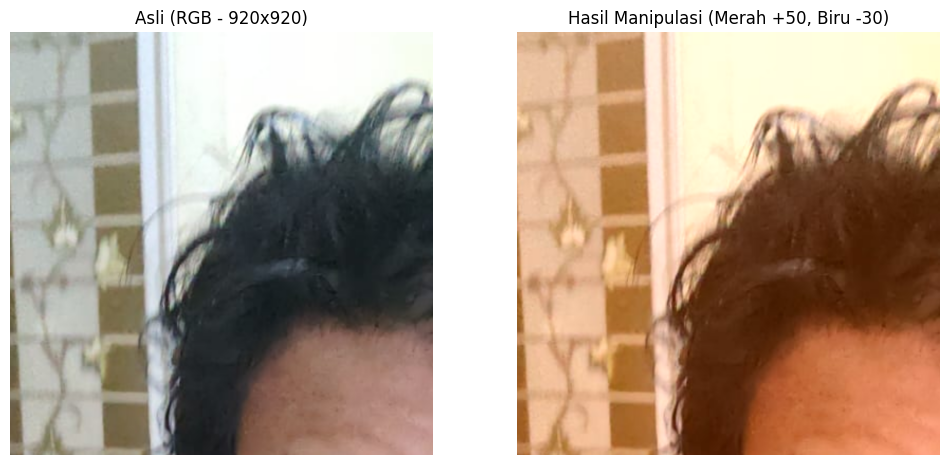

In [18]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Asumsikan variabel 'resized_face' (920x920, RGB, uint8) sudah ada dari Soal 1

# -----------------------------------------------------------------
# BAGIAN 1: MANIPULASI WARNA (BARU) 🎨
#
# 1. Buat salinan dan ubah tipe data ke int16 agar tidak overflow/underflow
#    (sangat penting!)
manipulated_face = resized_face.astype(np.int16)

# 2. Naikkan intensitas channel Merah (R) sebanyak 50 poin
#    Channel R (Red) ada di index 0
manipulated_face[:, :, 0] = manipulated_face[:, :, 0] + 50

# 3. Turunkan intensitas channel Biru (B) sebanyak 30 poin
#    Channel B (Blue) ada di index 2
manipulated_face[:, :, 2] = manipulated_face[:, :, 2] - 30

# 4. "Clip" (pangkas) nilainya agar tetap dalam rentang 0-255
#    Nilai > 255 akan menjadi 255
#    Nilai < 0 akan menjadi 0
manipulated_face = np.clip(manipulated_face, 0, 255)

# 5. Konversi kembali ke tipe data uint8 agar bisa ditampilkan
manipulated_face = manipulated_face.astype(np.uint8)
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 2: TAMPILKAN HASIL MANIPULASI
plt.figure(figsize=(12, 6))

# Gambar 1: Asli (RGB)
plt.subplot(1, 2, 1)
plt.title("Asli (RGB - 920x920)")
plt.imshow(resized_face)
plt.axis('off')

# Gambar 2: Hasil Manipulasi
plt.subplot(1, 2, 2)
plt.title("Hasil Manipulasi (Merah +50, Biru -30)")
plt.imshow(manipulated_face)
plt.axis('off')

plt.show()

* Teknik atau cara menaikkan/menurunkan intensitas **dibebaskan**, asalkan logis dan hasilnya terlihat.
* Gabungkan kembali channel warna dan **simpan gambar hasil modifikasi dalam format `.png`**.



Gambar telah berhasil disimpan sebagai: hasil_modifikasi_wajah.png


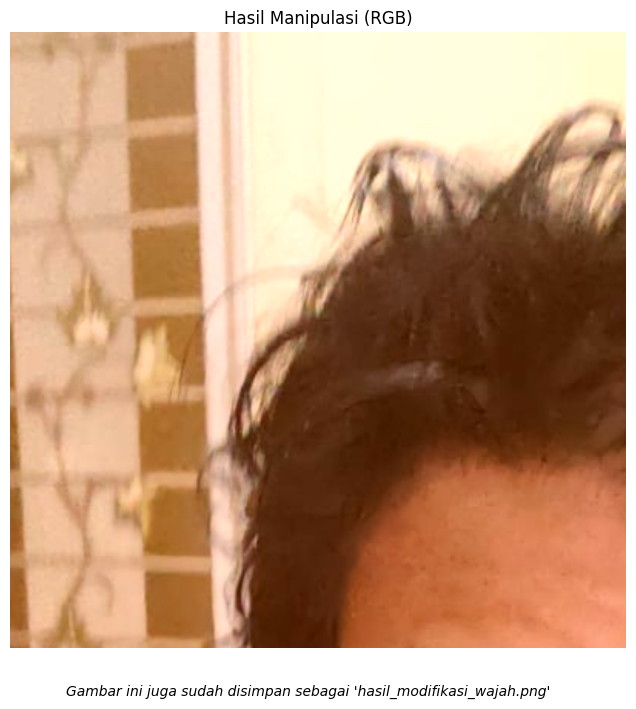

In [19]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Asumsikan variabel 'resized_face' (920x920, RGB, uint8) sudah ada dari Soal 1

# -----------------------------------------------------------------
# BAGIAN 1: MANIPULASI WARNA (DARI LANGKAH SEBELUMNYA)
manipulated_face_int16 = resized_face.astype(np.int16)
manipulated_face_int16[:, :, 0] = manipulated_face_int16[:, :, 0] + 50 # R
manipulated_face_int16[:, :, 2] = manipulated_face_int16[:, :, 2] - 30 # B
manipulated_face_clipped = np.clip(manipulated_face_int16, 0, 255)

# Ini adalah gambar hasil manipulasi kita dalam format RGB
manipulated_face_rgb = manipulated_face_clipped.astype(np.uint8)
# -----------------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN 2: SIMPAN GAMBAR KE .PNG (BARU) 💾
#
# Tentukan nama file
nama_file_output = "hasil_modifikasi_wajah.png"

# LANGKAH KRUSIAL: Konversi dari RGB (milik kita) ke BGR (untuk OpenCV)
gambar_untuk_disimpan_bgr = cv2.cvtColor(manipulated_face_rgb, cv2.COLOR_RGB2BGR)

# Simpan gambar menggunakan cv2.imwrite()
cv2.imwrite(nama_file_output, gambar_untuk_disimpan_bgr)

print(f"Gambar telah berhasil disimpan sebagai: {nama_file_output}")
# -----------------------------------------------------------------


# BAGIAN 3: TAMPILKAN HASIL (Konfirmasi)
plt.figure(figsize=(8, 8))
plt.title("Hasil Manipulasi (RGB)")
plt.imshow(manipulated_face_rgb)
plt.axis('off')
plt.figtext(0.5, 0.05, f"Gambar ini juga sudah disimpan sebagai '{nama_file_output}'",
            ha='center', fontsize=10, style='italic')
plt.show()

* **Tampilkan histogram per channel (R, G, B)** untuk gambar asli dan hasil modifikasi menggunakan `matplotlib.pyplot.hist`.

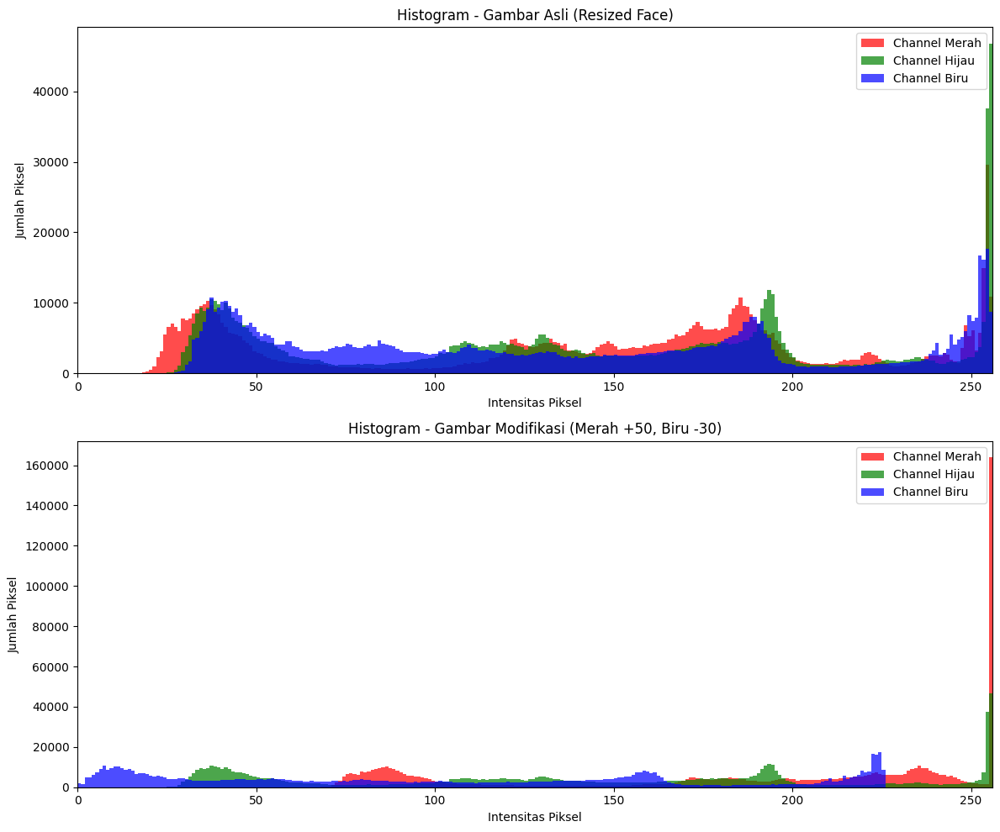

In [21]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- BAGIAN SETUP: Mengulang langkah-langkah sebelumnya ---
# --- agar kita memiliki variabel 'resized_face' dan 'manipulated_face_rgb' ---

# 1. Baca dan Crop
img = cv2.imread('selfie.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
y_start_wajah, y_end_wajah = 100, 500
x_start_wajah, x_end_wajah = 250, 650
cropped_face = img_rgb[y_start_wajah:y_end_wajah, x_start_wajah:x_end_wajah]

# 2. Resize
target_size = (920, 920)
resized_face = cv2.resize(cropped_face, target_size, interpolation=cv2.INTER_LINEAR)

# 3. Manipulasi
manipulated_face_int16 = resized_face.astype(np.int16)
manipulated_face_int16[:, :, 0] = manipulated_face_int16[:, :, 0] + 50 # R+50
manipulated_face_int16[:, :, 2] = manipulated_face_int16[:, :, 2] - 30 # B-30
manipulated_face_clipped = np.clip(manipulated_face_int16, 0, 255)
manipulated_face_rgb = manipulated_face_clipped.astype(np.uint8)

# --- SELESAI SETUP ---


# -----------------------------------------------------------------
# BAGIAN BARU: TAMPILKAN HISTOGRAM PER CHANNEL
# -----------------------------------------------------------------

# Pisahkan channel untuk kedua gambar
# .ravel() mengubah array 2D (920x920) menjadi 1D (satu baris panjang piksel)
r_asli, g_asli, b_asli = resized_face[:,:,0].ravel(), resized_face[:,:,1].ravel(), resized_face[:,:,2].ravel()
r_mod, g_mod, b_mod = manipulated_face_rgb[:,:,0].ravel(), manipulated_face_rgb[:,:,1].ravel(), manipulated_face_rgb[:,:,2].ravel()

# Tentukan jumlah bins (256, satu untuk setiap nilai piksel) dan rentang (0-256)
bins_count = 256
plot_range = [0, 256]

# Buat 2 plot (2 baris, 1 kolom)
plt.figure(figsize=(12, 10))

# --- Plot 1: Histogram Gambar Asli ---
plt.subplot(2, 1, 1)
plt.title("Histogram - Gambar Asli (Resized Face)")

# Gunakan plt.hist()
# alpha=0.7 agar transparan dan tidak saling menutupi
plt.hist(r_asli, bins=bins_count, range=plot_range, color='r', alpha=0.7, label='Channel Merah')
plt.hist(g_asli, bins=bins_count, range=plot_range, color='g', alpha=0.7, label='Channel Hijau')
plt.hist(b_asli, bins=bins_count, range=plot_range, color='b', alpha=0.7, label='Channel Biru')

plt.xlabel("Intensitas Piksel")
plt.ylabel("Jumlah Piksel")
plt.legend()
plt.xlim(plot_range) # Pastikan sumbu X dari 0 sampai 256

# --- Plot 2: Histogram Gambar Modifikasi ---
plt.subplot(2, 1, 2)
plt.title("Histogram - Gambar Modifikasi (Merah +50, Biru -30)")

plt.hist(r_mod, bins=bins_count, range=plot_range, color='r', alpha=0.7, label='Channel Merah')
plt.hist(g_mod, bins=bins_count, range=plot_range, color='g', alpha=0.7, label='Channel Hijau')
plt.hist(b_mod, bins=bins_count, range=plot_range, color='b', alpha=0.7, label='Channel Biru')

plt.xlabel("Intensitas Piksel")
plt.ylabel("Jumlah Piksel")
plt.legend()
plt.xlim(plot_range)

# Rapikan layout
plt.tight_layout()
plt.show()

* Jelaskan dampak perubahan RGB pada warna gambar dalam sel **Markdown**.

Penjelasan : Pada soal 2 ini, saya melakukan manipulasi warna secara langsung pada gambar hasil crop yang dimana sudah ada di ruang rgb, dan saya menaikkan inntensitas r sebanyak 50 dan b senbayak 30 poin, sedangkan g tetap, untuk mencegah kesalahan nilai format yang tidak valid diubah menjadi format valid dan memangkas nilai yang melebihi 255 atau kurang dari 0, ini termasuk dalam penanganan overflow/underflow, dan terakhir untuk histogram tersebut, histogram merah bergeser ke kanan lebih terang dengan lonjakan 255, untuk histogram biru bergeser ke kiri lebih gelap dengan lonjakan 0 dan histogram hijau tetap.

### **Soal 3 — Deteksi Tepi dan Filter Citra**

* Ambil gambar **objek dengan background bertekstur** (misalnya kain bermotif, jerami, atau batu).
* Terapkan **edge detection (Canny)** dan tampilkan hasilnya.



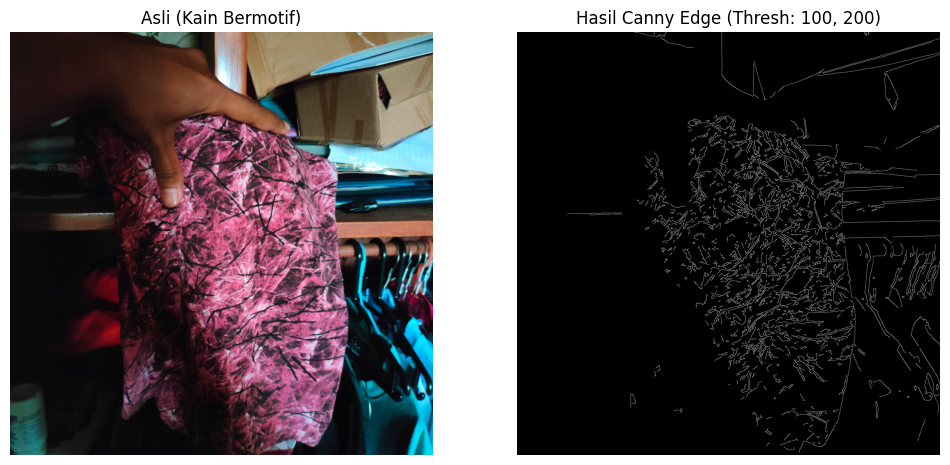

In [22]:
import cv2
import matplotlib.pyplot as plt

# 1. Baca gambar kain bermotif Anda
# Ganti 'kain_bermotif.jpg' dengan nama file Anda
img_kain = cv2.imread('kainbermotif.jpg')

# 2. Konversi ke Grayscale
# Canny HANYA bekerja pada gambar grayscale
gray_kain = cv2.cvtColor(img_kain, cv2.COLOR_BGR2GRAY)

# 3. (Sangat Disarankan) Terapkan Gaussian Blur untuk mengurangi noise
# Ini membantu Canny agar tidak terlalu "ramai"
blurred_kain = cv2.GaussianBlur(gray_kain, (5, 5), 0)

# 4. Terapkan Canny Edge Detection
# Kita perlu menentukan dua threshold: threshold1 (rendah) dan threshold2 (tinggi)
#
# - Tepi dengan gradien > threshold2 akan PASTI dianggap tepi.
# - Tepi dengan gradien < threshold1 akan PASTI DIBUANG (bukan tepi).
# - Tepi di antara keduanya, hanya akan dianggap tepi jika terhubung
#   dengan tepi yang "pasti" (di atas threshold2).
#
# !! Anda mungkin perlu mengubah angka 100 dan 200 ini !!
threshold1 = 100
threshold2 = 200

edges = cv2.Canny(blurred_kain, threshold1, threshold2)

# 5. Tampilkan Hasil
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
# Konversi BGR ke RGB untuk tampilan Matplotlib yang benar
plt.title("Asli (Kain Bermotif)")
plt.imshow(cv2.cvtColor(img_kain, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f"Hasil Canny Edge (Thresh: {threshold1}, {threshold2})")
# Tampilkan hasil Canny dengan cmap='gray'
plt.imshow(edges, cmap='gray')
plt.axis('off')

plt.show()

* Lakukan **thresholding dengan nilai ambang tertentu** (bebas Anda tentukan) agar hanya objek utama yang tersisa.



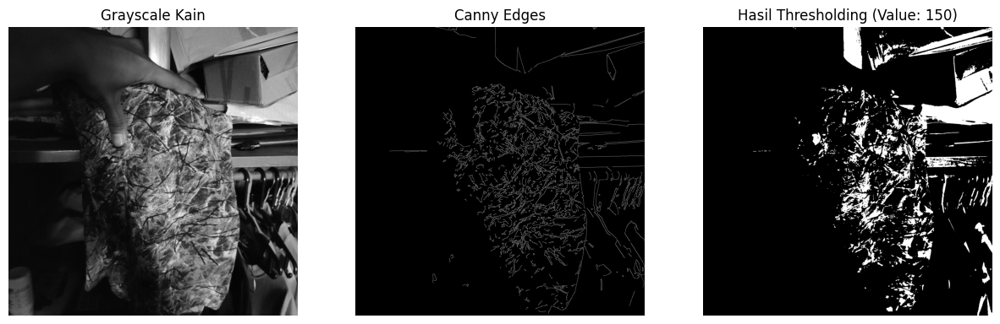

Nilai threshold yang digunakan: 150.0


In [25]:
import cv2
import matplotlib.pyplot as plt

# --- BAGIAN SETUP: Mengulang langkah-langkah sebelumnya ---
# --- agar kita memiliki variabel 'gray_kain' (grayscale) ---

# 1. Baca gambar kain bermotif
img_kain = cv2.imread('kainbermotif.jpg')
# 2. Konversi ke Grayscale
gray_kain = cv2.cvtColor(img_kain, cv2.COLOR_BGR2GRAY)
# --------------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN BARU: THRESHOLDING UNTUK OBJEK UTAMA ⚪⚫
# -----------------------------------------------------------------

# Tentukan nilai threshold
# !! PENTING: Anda harus menyesuaikan nilai ini (0-255) !!
# Cobalah beberapa nilai (misal: 127, 150, 200, dll.)
threshold_value = 150

# Lakukan Thresholding
# - cv2.THRESH_BINARY: piksel > threshold_value menjadi max_value (255/putih), lainnya menjadi 0 (hitam)
# - cv2.THRESH_BINARY_INV: kebalikannya
# - cv2.THRESH_TOZERO: piksel < threshold_value menjadi 0, lainnya tetap
# - cv2.THRESH_OTSU: (lebih lanjut) secara otomatis mencari threshold terbaik
ret, binary_image = cv2.threshold(gray_kain, threshold_value, 255, cv2.THRESH_BINARY)
# 'ret' adalah nilai threshold yang digunakan (berguna untuk OTSU)

# -----------------------------------------------------------------
# TAMPILKAN HASIL
plt.figure(figsize=(15, 5))

# Gambar 1: Grayscale
plt.subplot(1, 3, 1)
plt.title("Grayscale Kain")
plt.imshow(gray_kain, cmap='gray')
plt.axis('off')

# Gambar 2: Hasil Canny Edge (dari langkah sebelumnya, untuk konteks)
# Kita bisa tambahkan ini lagi untuk perbandingan
edges = cv2.Canny(cv2.GaussianBlur(gray_kain, (5, 5), 0), 100, 200)
plt.subplot(1, 3, 2)
plt.title("Canny Edges")
plt.imshow(edges, cmap='gray')
plt.axis('off')

# Gambar 3: Hasil Thresholding
plt.subplot(1, 3, 3)
plt.title(f"Hasil Thresholding (Value: {threshold_value})")
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

plt.show()

print(f"Nilai threshold yang digunakan: {ret}")

* Buat **bounding box** di sekitar objek hasil segmentasi (boleh manual atau otomatis).


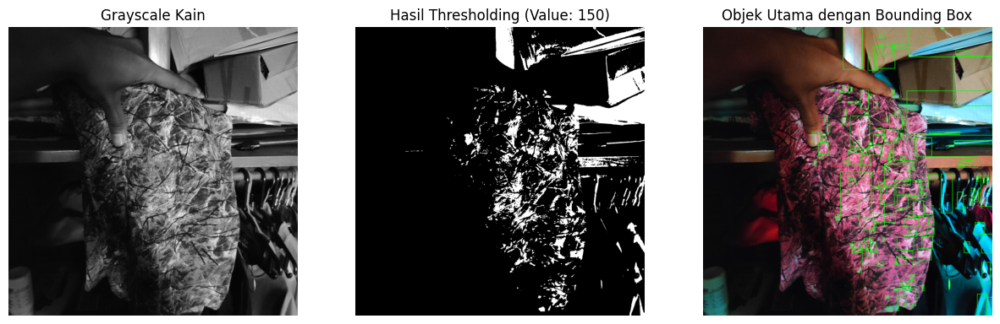

In [26]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- BAGIAN SETUP: Mengulang langkah-langkah sebelumnya ---
# --- agar kita memiliki variabel 'img_kain' (asli) dan 'binary_image' (hasil thresholding) ---

# 1. Baca gambar kain bermotif
img_kain = cv2.imread('kainbermotif.jpg')

# 2. Konversi ke Grayscale
gray_kain = cv2.cvtColor(img_kain, cv2.COLOR_BGR2GRAY)

# 3. Thresholding
threshold_value = 150 # Gunakan nilai threshold yang sudah Anda sesuaikan
ret, binary_image = cv2.threshold(gray_kain, threshold_value, 255, cv2.THRESH_BINARY)
# -------------------------------------------------------------------------------------


# -------------------------------------------------------------------------------------
# BAGIAN BARU: DETEKSI KONTUR DAN GAMBAR BOUNDING BOX 📦
# -------------------------------------------------------------------------------------

# Penting: cv2.findContours memodifikasi gambar input.
# Gunakan salinan binary_image jika Anda ingin binary_image tetap asli.
# Jika binary_image sudah hanya akan digunakan sekali, bisa langsung pakai.
contours, hierarchy = cv2.findContours(binary_image,
                                       cv2.RETR_EXTERNAL, # Mengambil hanya kontur luar (objek utama)
                                       cv2.CHAIN_APPROX_SIMPLE) # Menghemat memori dengan mengompres titik

# Buat salinan gambar asli untuk menggambar bounding box di atasnya
image_with_bboxes = img_kain.copy()
image_with_bboxes_rgb = cv2.cvtColor(image_with_bboxes, cv2.COLOR_BGR2RGB) # Konversi ke RGB untuk Matplotlib

# Iterasi melalui setiap kontur yang ditemukan
for contour in contours:
    # Filter kontur yang terlalu kecil (mungkin noise)
    # Anda mungkin perlu menyesuaikan area_min ini
    area = cv2.contourArea(contour)
    if area > 100: # Hanya pertimbangkan kontur dengan area lebih dari 100 pixel

        # Hitung bounding box (x, y, lebar, tinggi)
        x, y, w, h = cv2.boundingRect(contour)

        # Gambarlah persegi panjang (bounding box) pada gambar
        # Parameter: gambar, titik awal (x,y), titik akhir (x+w, y+h), warna (R,G,B), ketebalan
        cv2.rectangle(image_with_bboxes_rgb,
                      (x, y),                 # Titik kiri atas
                      (x + w, y + h),         # Titik kanan bawah
                      (0, 255, 0),            # Warna hijau (RGB)
                      2)                      # Ketebalan garis 2 pixel

# -------------------------------------------------------------------------------------
# TAMPILKAN HASIL
plt.figure(figsize=(15, 5))

# Gambar 1: Grayscale (untuk konteks)
plt.subplot(1, 3, 1)
plt.title("Grayscale Kain")
plt.imshow(gray_kain, cmap='gray')
plt.axis('off')

# Gambar 2: Hasil Thresholding (untuk konteks)
plt.subplot(1, 3, 2)
plt.title(f"Hasil Thresholding (Value: {threshold_value})")
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

# Gambar 3: Gambar Asli dengan Bounding Box
plt.subplot(1, 3, 3)
plt.title("Objek Utama dengan Bounding Box")
plt.imshow(image_with_bboxes_rgb)
plt.axis('off')

plt.show()

* Terapkan **filter blur** dan **filter sharpening**, lalu **bandingkan hasil keduanya**.


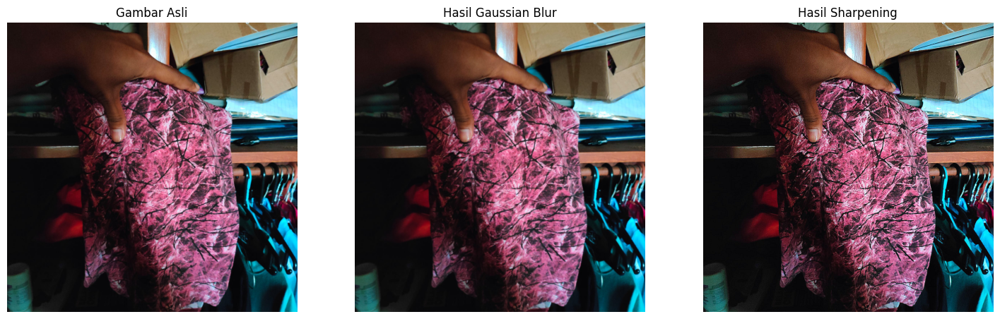

In [28]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- BAGIAN SETUP: Baca gambar asli ---
# 1. Baca gambar kain bermotif Anda
# Ganti 'kain_bermotif.jpg' dengan nama file Anda
img_kain = cv2.imread('kainbermotif.jpg')
img_kain_rgb = cv2.cvtColor(img_kain, cv2.COLOR_BGR2RGB) # Konversi ke RGB untuk tampilan Matplotlib
# -----------------------------------------------------


# -----------------------------------------------------------------
# BAGIAN BARU: APLIKASI FILTER BLUR DAN SHARPEN ⚙️
# -----------------------------------------------------------------

# 1. Terapkan Filter BLUR (Gaussian Blur)
# (5, 5) adalah ukuran kernel (matriks filter) - harus ganjil
# 0 adalah standar deviasi di sumbu X dan Y, biarkan 0 agar dihitung otomatis
blurred_image = cv2.GaussianBlur(img_kain_rgb, (5, 5), 0)


# 2. Terapkan Filter SHARPENING
# Sharpening biasanya dilakukan dengan kernel konvolusi kustom.
# Ini adalah contoh kernel sharpening yang umum:
kernel_sharpening = np.array([[-1, -1, -1],
                              [-1,  9, -1],
                              [-1, -1, -1]])

# Gunakan cv2.filter2D untuk menerapkan kernel
# Parameter -1 menunjukkan output depth sama dengan input (dtype)
sharpened_image = cv2.filter2D(img_kain_rgb, -1, kernel_sharpening)

# -----------------------------------------------------------------
# TAMPILKAN HASIL PERBANDINGAN
plt.figure(figsize=(18, 6))

# Gambar 1: Asli
plt.subplot(1, 3, 1)
plt.title("Gambar Asli")
plt.imshow(img_kain_rgb)
plt.axis('off')

# Gambar 2: Hasil Blur
plt.subplot(1, 3, 2)
plt.title("Hasil Gaussian Blur")
plt.imshow(blurred_image)
plt.axis('off')

# Gambar 3: Hasil Sharpening
plt.subplot(1, 3, 3)
plt.title("Hasil Sharpening")
plt.imshow(sharpened_image)
plt.axis('off')

plt.show()

* Jelaskan bagaimana setiap filter memengaruhi detail gambar dalam format **Markdown**.

Penjelasan : Jadi pada soal ini, saya melakukan canny edge detection, segmentasi, bounding box, dan perbandingan filter. Di canny edge detection ini saya melakukan konversi gambar kain bermotif menjadi grayscale dan menerapkan gaussian blur untuk mengurangi noise dengan menggunakan cv2.canny dengan dua nilai treshold rendan dan tinggi untuk mengekstrak tepi garis motif pada gambar. untuk segmentasi atau tresholding saya mengambil gambar grayscale dan menerapkan cv2.tresholding dengan metode thresh_binary, mementukan nilai tresholding saya mengubah gambar menjadi biner dan memisahkan antara objek utama dan latar belakang. Bounding box menggunakan biner hasil tresholding saya menerapkan cv2.findCountours untuk menemukan semua bentuk objek yanng sudah disegmentasi, selanjutnya saya mengulang setiap kontur yang ditemukan menghitung bounding boxnya dan menggambar kottak hijaunya. Perbandingan filter, menghasilkan gambar yang lebih halus lembut dan mengurangi detail untuk Filter Blur, untuk filter sharpening menghasilkan gambar yang lebih tajam menonjolkan tepi dan memperjelas motif.

### **Soal 4 — Deteksi Wajah dan Filter Digital Kreatif**

* Ambil gambar diri Anda dengan ekspresi wajah **netral**.
* Lakukan **deteksi wajah dan landmark** menggunakan salah satu dari:

  * **MediaPipe**, atau
  * **Dlib**, atau
  * **OpenCV**.


/usr/local/lib/python3.12/dist-packages/jaxlib/plugin_support.py:71: RuntimeWarning: JAX plugin jax_cuda12_plugin version 0.7.2 is installed, but it is not compatible with the installed jaxlib version 0.7.1, so it will not be used.
  warnings.warn(


Ditemukan 1 wajah.


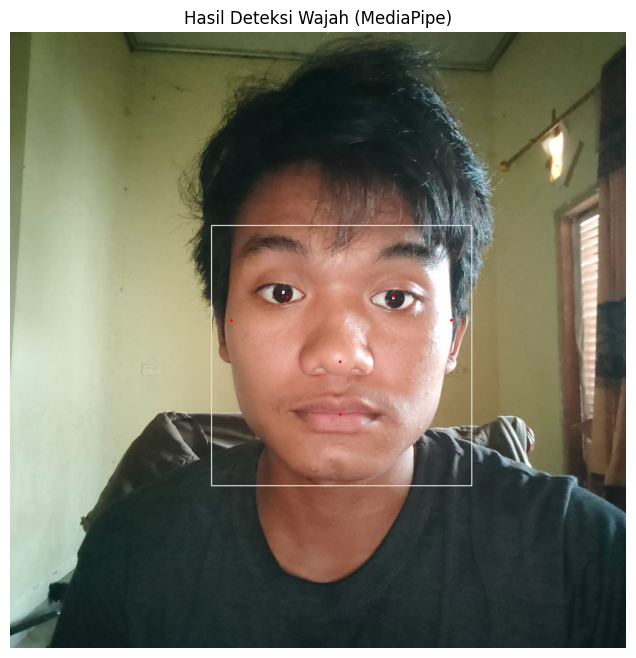

In [1]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

# --- 1. Inisialisasi MediaPipe Face Detection ---
mp_face_detection = mp.solutions.face_detection
mp_drawing = mp.solutions.drawing_utils

# 'with' block ini penting untuk menginisialisasi model
# model_selection=0 -> paling baik untuk foto jarak dekat (selfie)
# min_detection_confidence=0.5 -> ambang batas kepercayaan (50%)
with mp_face_detection.FaceDetection(
    model_selection=0, min_detection_confidence=0.5) as face_detection:

    # --- 2. Muat dan Proses Gambar ---
    # Ganti 'selfie.jpg' dengan nama file foto Anda
    image = cv2.imread('fotodatar.jpg')

    # Konversi BGR (OpenCV) ke RGB (MediaPipe)
    # MediaPipe MEMBUTUHKAN gambar RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Proses gambar untuk menemukan wajah
    results = face_detection.process(image_rgb)

    # --- 3. Gambar Hasil Deteksi ---
    # Buat salinan gambar asli (BGR) untuk menggambar di atasnya
    annotated_image = image.copy()

    if results.detections:
        print(f"Ditemukan {len(results.detections)} wajah.")

        # Loop untuk setiap wajah yang terdeteksi
        for detection in results.detections:
            # mp_drawing.draw_detection() adalah fungsi bawaan MediaPipe
            # untuk menggambar bounding box dan 6 keypoint dasar
            mp_drawing.draw_detection(annotated_image, detection)

            # (Opsional) Jika Anda ingin bounding box saja, Anda bisa menggambarnya manual
            # menggunakan cv2.rectangle() dengan data dari detection.location_data

    else:
        print("Tidak ada wajah yang terdeteksi.")

    # --- 4. Tampilkan Hasil ---
    plt.figure(figsize=(8, 8))
    plt.title("Hasil Deteksi Wajah (MediaPipe)")
    # Konversi BGR (tempat kita menggambar) kembali ke RGB (untuk Matplotlib)
    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

* Buat **overlay filter digital kreatif** karya Anda sendiri, misalnya:

  * topi, kumis, masker, helm, aksesoris, atau bentuk unik lainnya.
  * Filter boleh dibuat dari **gambar eksternal (PNG)** *atau* digambar langsung (misal bentuk lingkaran, garis, poligon, dll).
* Pastikan posisi overlay menyesuaikan **landmark wajah** dengan logis.
* **Gunakan alpha blending sebagai saran** agar hasil tampak lebih natural.


Ditemukan 1 wajah.


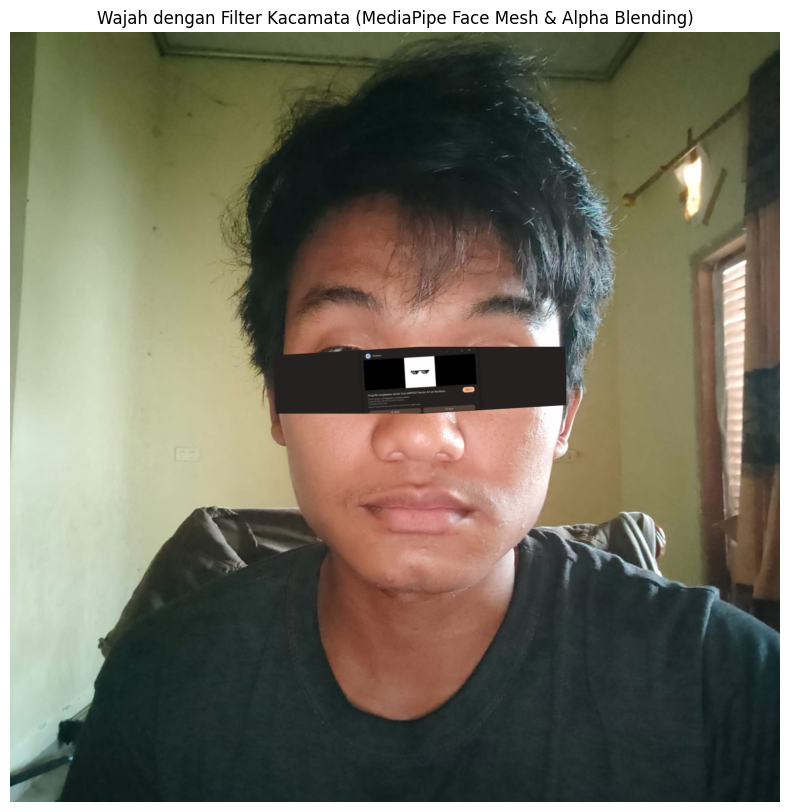

In [3]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
import numpy as np
import math # Untuk fungsi matematika seperti atan2, degrees

# --- 1. Inisialisasi MediaPipe Face Mesh ---
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils

# Parameter untuk Face Mesh
# static_image_mode=True karena kita memproses satu foto statis
# max_num_faces=1 karena umumnya satu wajah di selfie
# min_detection_confidence=0.5, min_tracking_confidence=0.5
with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5) as face_mesh:

    # --- 2. Muat Gambar (Wajah & Kacamata) ---
    image = cv2.imread('fotodatar.jpg')
    if image is None:
        print("Error: Gagal memuat gambar selfie. Pastikan 'selfie.jpg' ada.")
        exit()

    # Konversi BGR ke RGB untuk MediaPipe
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Muat gambar kacamata. Pastikan memiliki alpha channel.
    kacamata_img = cv2.imread('kacamata.png', cv2.IMREAD_UNCHANGED)
    if kacamata_img is None:
        print("Error: Gagal memuat gambar kacamata. Pastikan 'kacamata.png' ada dan punya alpha channel.")
        exit()

    # --- 3. Proses Gambar untuk Deteksi Face Mesh ---
    results = face_mesh.process(image_rgb)

    # Buat salinan gambar asli untuk overlay
    annotated_image = image_rgb.copy() # Mulai dari RGB karena Matplotlib

    # --- 4. Overlay Kacamata jika Wajah Ditemukan ---
    if results.multi_face_landmarks:
        print(f"Ditemukan {len(results.multi_face_landmarks)} wajah.")
        for face_landmarks in results.multi_face_landmarks:
            # MediaPipe punya landmark spesifik untuk mata
            # Contoh: Landmark mata kiri (iris): 468, 470, 471, 472, 473
            # Landmark mata kanan (iris): 473, 474, 475, 476, 477
            # Lebih mudah ambil landmark di sudut luar mata:
            # Contoh: mata kiri (kiri): 33, mata kiri (kanan): 133
            # mata kanan (kiri): 362, mata kanan (kanan): 263

            # Ambil koordinat landmark mata kiri (luar) dan mata kanan (luar)
            # Kita akan gunakan landmark 33 dan 263 sebagai referensi
            # (ini adalah titik terluar dari mata kiri dan kanan pada face_mesh)

            # Koordinat mata kiri (landmark 33)
            # Karena koordinat MediaPipe dinormalisasi (0-1), kalikan dengan lebar/tinggi gambar
            lm_left_eye_outer = face_landmarks.landmark[33]
            left_eye_x = int(lm_left_eye_outer.x * image.shape[1])
            left_eye_y = int(lm_left_eye_outer.y * image.shape[0])

            # Koordinat mata kanan (landmark 263)
            lm_right_eye_outer = face_landmarks.landmark[263]
            right_eye_x = int(lm_right_eye_outer.x * image.shape[1])
            right_eye_y = int(lm_right_eye_outer.y * image.shape[0])

            # Ambil koordinat pangkal hidung (landmark 1) untuk referensi pusat wajah
            lm_nose_bridge = face_landmarks.landmark[1]
            nose_x = int(lm_nose_bridge.x * image.shape[1])
            nose_y = int(lm_nose_bridge.y * image.shape[0])


            # --- Hitung Rotasi Kacamata ---
            # Sudut antara kedua mata menentukan rotasi kepala
            angle_rad = math.atan2(right_eye_y - left_eye_y, right_eye_x - left_eye_x)
            angle_deg = math.degrees(angle_rad)

            # --- Hitung Ukuran Kacamata ---
            # Jarak antar mata sebagai referensi lebar kacamata
            eye_distance = math.sqrt((right_eye_x - left_eye_x)**2 + (right_eye_y - left_eye_y)**2)

            # Skala kacamata (Anda mungkin perlu menyesuaikan faktor ini)
            # Misal, kacamata_img.shape[1] adalah lebar asli gambar kacamata
            scale_factor = eye_distance / (kacamata_img.shape[1] * 0.7) # Misal, 70% lebar kacamata menutupi jarak antar mata

            new_width = int(kacamata_img.shape[1] * scale_factor)
            new_height = int(kacamata_img.shape[0] * scale_factor)

            # Resize kacamata ke ukuran baru
            resized_kacamata = cv2.resize(kacamata_img, (new_width, new_height), interpolation=cv2.INTER_AREA)

            # Pisahkan channel RGB dan Alpha
            # Cek apakah gambar kacamata memiliki alpha channel (4 channel), RGB (3 channel), atau Grayscale (2D)
            kacamata_rgb_output = None
            kacamata_alpha_output = None

            if resized_kacamata.ndim == 3 and resized_kacamata.shape[2] == 4:
                kacamata_rgb_output = resized_kacamata[:,:,0:3]
                kacamata_alpha_output = resized_kacamata[:,:,3] / 255.0 # Normalisasi alpha ke 0-1
            elif resized_kacamata.ndim == 3 and resized_kacamata.shape[2] == 3:
                kacamata_rgb_output = resized_kacamata
                kacamata_alpha_output = np.ones(resized_kacamata.shape[0:2], dtype=np.float32) # Alpha penuh untuk RGB
            elif resized_kacamata.ndim == 2: # Grayscale image
                print("Peringatan: Gambar kacamata adalah grayscale. Mengubah ke RGB dan alpha penuh.")
                kacamata_rgb_output = cv2.cvtColor(resized_kacamata, cv2.COLOR_GRAY2RGB)
                kacamata_alpha_output = np.ones(resized_kacamata.shape[0:2], dtype=np.float32)
            else:
                print(f"Peringatan: Gambar kacamata memiliki dimensi atau channel yang tidak terduga ({resized_kacamata.shape}). Menggunakan asumsi RGB dan alpha penuh.")
                # Fallback for other unexpected cases
                if resized_kacamata.ndim == 3 and resized_kacamata.shape[2] > 0:
                    kacamata_rgb_output = resized_kacamata[:,:,0:min(resized_kacamata.shape[2], 3)] # Take first 3 channels
                else:
                    # Create a black RGB image if source is completely unhandleable
                    kacamata_rgb_output = np.zeros((resized_kacamata.shape[0], resized_kacamata.shape[1], 3), dtype=np.uint8)
                kacamata_alpha_output = np.ones(resized_kacamata.shape[0:2], dtype=np.float32)

            kacamata_rgb = kacamata_rgb_output
            kacamata_alpha = kacamata_alpha_output

            # --- Hitung Posisi Kacamata ---
            # Posisi tengah antara dua mata
            center_x = (left_eye_x + right_eye_x) // 2
            center_y = (left_eye_y + right_eye_y) // 2

            # Sesuaikan offset Y agar kacamata pas di bawah alis, bukan di tengah mata
            # Ini mungkin perlu trial-error
            offset_y = int(new_height * 0.3) # Misal, geser 30% tinggi kacamata ke bawah
            center_y += offset_y

            # Rotasi kacamata (jika wajah miring)
            M = cv2.getRotationMatrix2D((new_width // 2, new_height // 2), angle_deg, 1)
            rotated_kacamata_rgb = cv2.warpAffine(kacamata_rgb, M, (new_width, new_height))
            rotated_kacamata_alpha = cv2.warpAffine(kacamata_alpha, M, (new_width, new_height))


            # Posisi untuk overlay
            # Hitung titik kiri atas (top-left corner)
            y1, y2 = int(center_y - new_height/2), int(center_y + new_height/2)
            x1, x2 = int(center_x - new_width/2), int(center_x + new_width/2)

            # Pastikan koordinat tidak melebihi batas gambar
            y1 = max(0, y1)
            x1 = max(0, x1)
            y2 = min(annotated_image.shape[0], y2)
            x2 = min(annotated_image.shape[1], x2)

            # Ukuran area overlay sebenarnya
            # Pastikan ukuran ROI tidak negatif atau nol
            roi_h = max(0, y2 - y1)
            roi_w = max(0, x2 - x1)

            # Pastikan rotated_kacamata_rgb/alpha memiliki ukuran yang sesuai dengan ROI
            if roi_h == 0 or roi_w == 0: # Avoid errors if ROI is empty
                print("Peringatan: Area overlay kacamata terlalu kecil atau kosong. Melewati overlay.")
                continue # Skip to next face or end loop

            # Crop rotated_kacamata to match ROI size
            kacamata_alpha_roi = rotated_kacamata_alpha[0:roi_h, 0:roi_w]
            kacamata_rgb_roi = rotated_kacamata_rgb[0:roi_h, 0:roi_w]

            # Ambil bagian gambar wajah yang akan di-overlay
            roi = annotated_image[y1:y2, x1:x2]

            # Formula Alpha Blending: output = alpha * foreground + (1 - alpha) * background
            # Perlu diperluas dimensinya agar broadcastable (3 channel)
            alpha_multiplier = kacamata_alpha_roi[:, :, np.newaxis]

            # Melakukan blending
            annotated_image[y1:y2, x1:x2] = (alpha_multiplier * kacamata_rgb_roi +
                                             (1 - alpha_multiplier) * roi).astype(np.uint8)

            # (Opsional) Gambarlah landmark untuk debug
            # mp_drawing.draw_landmarks(
            #     annotated_image,
            #     face_landmarks,
            #     mp_face_mesh.FACEMESH_CONTOURS,
            #     landmark_drawing_spec=None,
            #     connection_drawing_spec=mp_drawing.DrawingSpec(color=(255, 0, 0), thickness=1, circle_radius=1))

    else:
        print("Tidak ada wajah yang terdeteksi oleh Face Mesh.")

    # --- 5. Tampilkan Hasil ---
    plt.figure(figsize=(10, 10))
    plt.title("Wajah dengan Filter Kacamata (MediaPipe Face Mesh & Alpha Blending)")
    plt.imshow(annotated_image)
    plt.axis('off')
    plt.show()

* Tampilkan perbandingan antara **gambar asli** dan **hasil dengan filter**.


Ditemukan 1 wajah.


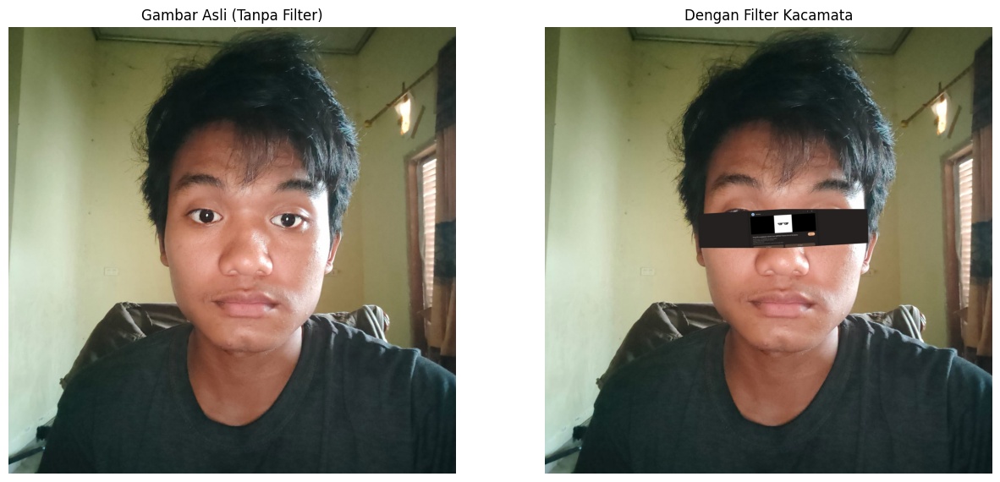

In [6]:
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
import numpy as np
import math

# --- 1. Inisialisasi MediaPipe Face Mesh ---
mp_face_mesh = mp.solutions.face_mesh
mp_drawing = mp.solutions.drawing_utils

with mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5) as face_mesh:

    # --- 2. Muat Gambar (Wajah & Kacamata) ---
    image = cv2.imread('fotodatar.jpg')
    if image is None:
        print("Error: Gagal memuat gambar selfie. Pastikan 'selfie.jpg' ada.")
        exit()

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    kacamata_img = cv2.imread('kacamata.png', cv2.IMREAD_UNCHANGED)
    if kacamata_img is None:
        print("Error: Gagal memuat gambar kacamata. Pastikan 'kacamata.png' ada dan punya alpha channel.")
        exit()

    # --- 3. Proses Gambar untuk Deteksi Face Mesh ---
    results = face_mesh.process(image_rgb)

    # Buat salinan gambar asli untuk overlay
    annotated_image = image_rgb.copy() # Gambar untuk di-overlay kacamata

    # --- 4. Overlay Kacamata jika Wajah Ditemukan ---
    if results.multi_face_landmarks:
        print(f"Ditemukan {len(results.multi_face_landmarks)} wajah.")
        for face_landmarks in results.multi_face_landmarks:
            lm_left_eye_outer = face_landmarks.landmark[33]
            left_eye_x = int(lm_left_eye_outer.x * image.shape[1])
            left_eye_y = int(lm_left_eye_outer.y * image.shape[0])

            lm_right_eye_outer = face_landmarks.landmark[263]
            right_eye_x = int(lm_right_eye_outer.x * image.shape[1])
            right_eye_y = int(lm_right_eye_outer.y * image.shape[0])

            angle_rad = math.atan2(right_eye_y - left_eye_y, right_eye_x - left_eye_x)
            angle_deg = math.degrees(angle_rad)

            eye_distance = math.sqrt((right_eye_x - left_eye_x)**2 + (right_eye_y - left_eye_y)**2)
            scale_factor = eye_distance / (kacamata_img.shape[1] * 0.7) # Sesuaikan 0.7 jika perlu

            new_width = int(kacamata_img.shape[1] * scale_factor)
            new_height = int(kacamata_img.shape[0] * scale_factor)

            resized_kacamata = cv2.resize(kacamata_img, (new_width, new_height), interpolation=cv2.INTER_AREA)

            # Pisahkan channel RGB dan Alpha dengan pengecekan dimensi
            kacamata_rgb = None
            kacamata_alpha = None

            if resized_kacamata.ndim == 3 and resized_kacamata.shape[2] == 4:
                kacamata_rgb = resized_kacamata[:,:,0:3]
                kacamata_alpha = resized_kacamata[:,:,3] / 255.0 # Normalisasi alpha ke 0-1
            elif resized_kacamata.ndim == 3 and resized_kacamata.shape[2] == 3:
                kacamata_rgb = resized_kacamata
                kacamata_alpha = np.ones(resized_kacamata.shape[0:2], dtype=np.float32) # Alpha penuh untuk RGB
            elif resized_kacamata.ndim == 2: # Grayscale image
                print("Peringatan: Gambar kacamata adalah grayscale. Mengubah ke RGB dan alpha penuh.")
                kacamata_rgb = cv2.cvtColor(resized_kacamata, cv2.COLOR_GRAY2RGB)
                kacamata_alpha = np.ones(resized_kacamata.shape[0:2], dtype=np.float32)
            else:
                print(f"Peringatan: Gambar kacamata memiliki dimensi atau channel yang tidak terduga ({resized_kacamata.shape}). Menggunakan asumsi RGB dan alpha penuh.")
                if resized_kacamata.ndim == 3 and resized_kacamata.shape[2] > 0:
                    kacamata_rgb = resized_kacamata[:,:,0:min(resized_kacamata.shape[2], 3)]
                else:
                    kacamata_rgb = np.zeros((resized_kacamata.shape[0], resized_kacamata.shape[1], 3), dtype=np.uint8)
                kacamata_alpha = np.ones(resized_kacamata.shape[0:2], dtype=np.float32)


            center_x = (left_eye_x + right_eye_x) // 2
            center_y = (left_eye_y + right_eye_y) // 2

            offset_y = int(new_height * 0.3) # Sesuaikan 0.3 jika perlu
            center_y += offset_y

            M = cv2.getRotationMatrix2D((new_width // 2, new_height // 2), angle_deg, 1)
            rotated_kacamata_rgb = cv2.warpAffine(kacamata_rgb, M, (new_width, new_height))
            rotated_kacamata_alpha = cv2.warpAffine(kacamata_alpha, M, (new_width, new_height))

            y1, y2 = int(center_y - new_height/2), int(center_y + new_height/2)
            x1, x2 = int(center_x - new_width/2), int(center_x + new_width/2)

            y1 = max(0, y1)
            x1 = max(0, x1)
            y2 = min(annotated_image.shape[0], y2)
            x2 = min(annotated_image.shape[1], x2)

            roi = annotated_image[y1:y2, x1:x2]

            # Pastikan ukuran ROI tidak negatif atau nol
            roi_h = max(0, y2 - y1)
            roi_w = max(0, x2 - x1)

            if roi_h == 0 or roi_w == 0: # Avoid errors if ROI is empty
                print("Peringatan: Area overlay kacamata terlalu kecil atau kosong. Melewati overlay.")
                continue

            kacamata_alpha_roi = rotated_kacamata_alpha[0:roi_h, 0:roi_w]
            kacamata_rgb_roi = rotated_kacamata_rgb[0:roi_h, 0:roi_w]

            alpha_multiplier = kacamata_alpha_roi[:, :, np.newaxis]

            annotated_image[y1:y2, x1:x2] = (alpha_multiplier * kacamata_rgb_roi +
                                             (1 - alpha_multiplier) * roi).astype(np.uint8)

    else:
        print("Tidak ada wajah yang terdeteksi oleh Face Mesh.")

    # --- 5. Tampilkan Hasil Perbandingan ---
    plt.figure(figsize=(15, 7))

    # Gambar 1: Asli
    plt.subplot(1, 2, 1)
    plt.title("Gambar Asli (Tanpa Filter)")
    plt.imshow(image_rgb) # Tampilkan gambar asli (RGB)
    plt.axis('off')

    # Gambar 2: Dengan Filter Kacamata
    plt.subplot(1, 2, 2)
    plt.title("Dengan Filter Kacamata")
    plt.imshow(annotated_image) # Gambar dengan kacamata
    plt.axis('off')

    plt.show()

* Jelaskan bagaimana Anda menghitung posisi overlay dan tantangan yang dihadapi selama implementasi (gunakan **Markdown**).

Penjelasan : Jadi tantangan saya dalam menjalankan filtering ini, dikarenakan saya tidak menghapus background dari gambar kacamata yang saya download maka hasilnya seperti itu, dan saya melakukannya dalam sekali percobaan gagal dan dibenarkan langsung oleh ai yang ada di collab, selanjutnya pada soal 4 ini saya melakukan deteksi awal menggunakan mediapipe dan menggambar bounding box, melakukan deteksi landmark, kalkulasi geometris untuk filter, melakukan overlay dan alpha blending, dan melakukan perbandingan. Dan untuk menghitung posisi overlay gambar kacamata di resize dan di rotasi sesuai perhitungan dan menggunakan alpha channel transparansi dari gambar kacamata.

### **Soal 5 — Perspektif dan Peningkatan Kualitas Citra**

* Ambil gambar **objek datar** seperti karya tangan di kertas, tulisan di papan tulis, atau foto produk di meja dengan kondisi pencahayaan atau sudut yang tidak ideal.
* Lakukan **preprocessing** untuk memperbaiki tampilan agar lebih rapi dan jelas, dengan langkah-langkah:

  * Konversi ke **grayscale**.
  * **Koreksi perspektif (transformasi homografi)** menggunakan **4 titik manual** agar objek terlihat sejajar dan tidak terdistorsi.
  * Terapkan **thresholding adaptif atau Otsu** (pilih salah satu, dan jelaskan alasan pilihan Anda).


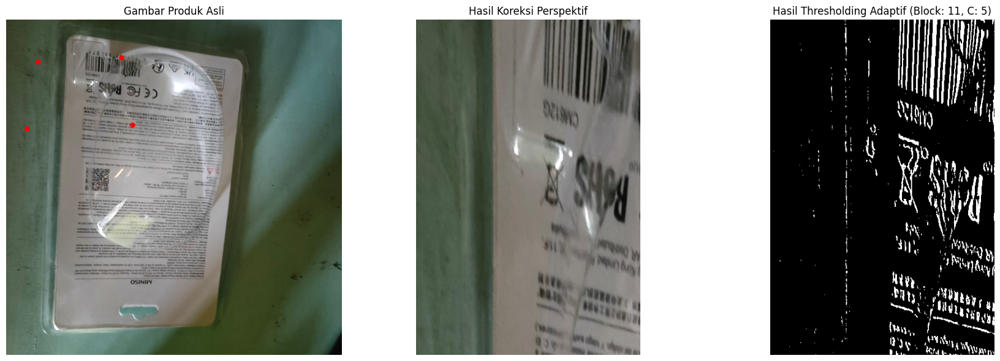

In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Muat Gambar Produk ---
image_product = cv2.imread('fotoproduk.jpg')
if image_product is None:
    print("Error: Gagal memuat gambar produk. Pastikan 'fotoproduk.jpg' ada.")
    exit()

image_product_rgb = cv2.cvtColor(image_product, cv2.COLOR_BGR2RGB)


# --- 2. Konversi ke Grayscale ---
gray_product = cv2.cvtColor(image_product, cv2.COLOR_BGR2GRAY)


# --- 3. Koreksi Perspektif Menggunakan 4 Titik Manual ---
#
# !! PENTING: Anda harus MENGGANTI koordinat ini dengan koordinat AKTUAL
# !! 4 sudut objek utama di foto Anda.
#
# Contoh koordinat (X, Y) untuk 4 titik sudut objek yang TIDAK SEJAJAR:
# (Asumsi objek miring atau perspektifnya condong)
pts1 = np.float32([
    [150, 200],  # Pojok kiri atas objek di gambar asli
    [550, 180],  # Pojok kanan atas objek di gambar asli
    [600, 500],  # Pojok kanan bawah objek di gambar asli
    [100, 520]   # Pojok kiri bawah objek di gambar asli
])

# Tentukan dimensi output yang diinginkan (persegi panjang sempurna)
# Misalnya, kita ingin hasil koreksi memiliki lebar 400 dan tinggi 600 pixel
output_width = 400
output_height = 600

# Koordinat 4 titik tujuan (sudut persegi panjang sempurna)
pts2 = np.float32([
    [0, 0],                            # Pojok kiri atas output
    [output_width - 1, 0],             # Pojok kanan atas output
    [output_width - 1, output_height - 1], # Pojok kanan bawah output
    [0, output_height - 1]             # Pojok kiri bawah output
])

# Hitung matriks transformasi perspektif
matrix = cv2.getPerspectiveTransform(pts1, pts2)

# Terapkan transformasi perspektif pada gambar grayscale
warped_gray_product = cv2.warpPerspective(gray_product, matrix, (output_width, output_height))

# Terapkan transformasi perspektif pada gambar RGB (untuk tampilan perbandingan)
warped_rgb_product = cv2.warpPerspective(image_product_rgb, matrix, (output_width, output_height))


# --- 4. Thresholding Adaptif ---
#
# Metode: cv2.ADAPTIVE_THRESH_GAUSSIAN_C (menggunakan rata-rata Gaussian)
# cv2.ADAPTIVE_THRESH_MEAN_C (menggunakan rata-rata biasa)
#
# BLOCK_SIZE: Ukuran area piksel tetangga yang dipertimbangkan (harus ganjil: 3, 5, 7, ...)
# C: Konstanta yang dikurangi dari rata-rata (bisa positif atau negatif)
#    - Jika objek lebih gelap dari latar: C positif (misal 5-15)
#    - Jika objek lebih terang dari latar: C negatif (misal -5 sampai -15)
#
block_size = 11 # Coba 11, 15, 21
C_value = 5   # Coba 2, 5, 10, atau -5

# Lakukan Adaptive Thresholding pada gambar grayscale yang sudah dikoreksi perspektif
adaptive_thresh_product = cv2.adaptiveThreshold(warped_gray_product,
                                                255, # Nilai maksimum jika piksel melewati threshold
                                                cv2.ADAPTIVE_THRESH_GAUSSIAN_C, # Metode: Gaussian Weighted Sum
                                                cv2.THRESH_BINARY_INV, # Jenis Threshold: Objek Hitam, Background Putih
                                                block_size,
                                                C_value)


# --- 5. Tampilkan Hasil ---
plt.figure(figsize=(18, 6))

# Plot 1: Gambar Asli
plt.subplot(1, 3, 1)
plt.title("Gambar Produk Asli")
plt.imshow(image_product_rgb)
# (Opsional) Gambarlah titik-titik pts1 pada gambar asli
for pt in pts1:
    plt.plot(pt[0], pt[1], 'ro', markersize=5) # 'ro' = red circle
plt.axis('off')

# Plot 2: Hasil Koreksi Perspektif
plt.subplot(1, 3, 2)
plt.title("Hasil Koreksi Perspektif")
plt.imshow(warped_rgb_product)
plt.axis('off')

# Plot 3: Hasil Thresholding Adaptif
plt.subplot(1, 3, 3)
plt.title(f"Hasil Thresholding Adaptif (Block: {block_size}, C: {C_value})")
plt.imshow(adaptive_thresh_product, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

* Tampilkan **setiap tahap pemrosesan dalam satu grid** agar mudah dibandingkan.


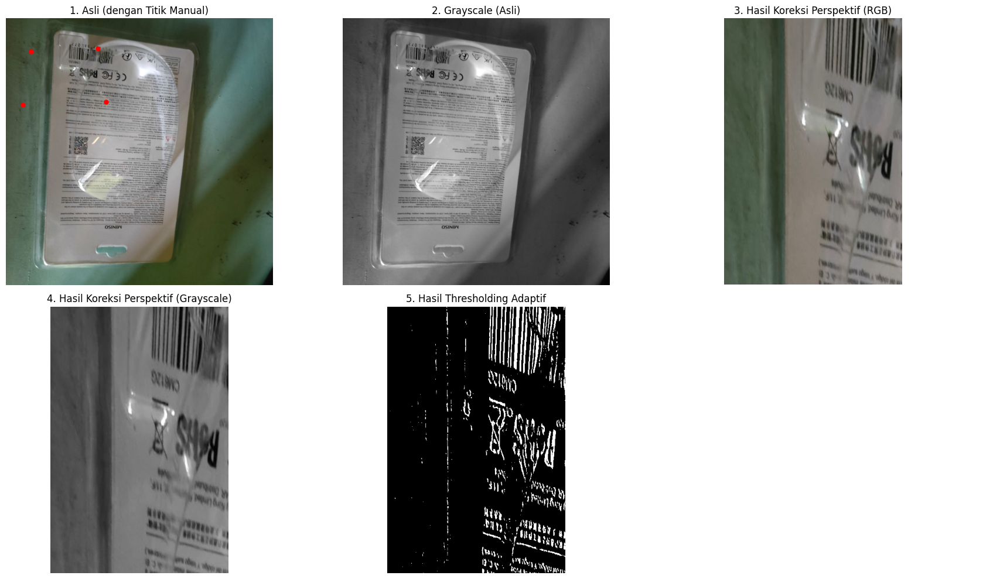

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Muat Gambar Produk ---
image_product = cv2.imread('fotoproduk.jpg')
if image_product is None:
    print("Error: Gagal memuat gambar produk. Pastikan 'fotoproduk.jpg' ada.")
    exit()

image_product_rgb = cv2.cvtColor(image_product, cv2.COLOR_BGR2RGB)

# --- 2. Konversi ke Grayscale ---
gray_product = cv2.cvtColor(image_product, cv2.COLOR_BGR2GRAY)

# --- 3. Koreksi Perspektif Menggunakan 4 Titik Manual ---
# !! GANTI KOORDINAT INI !!
pts1 = np.float32([
    [150, 200],  # Kiri Atas
    [550, 180],  # Kanan Atas
    [600, 500],  # Kanan Bawah
    [100, 520]   # Kiri Bawah
])

output_width = 400
output_height = 600

pts2 = np.float32([
    [0, 0], [output_width - 1, 0],
    [output_width - 1, output_height - 1], [0, output_height - 1]
])

matrix = cv2.getPerspectiveTransform(pts1, pts2)

# Warp versi Grayscale
warped_gray_product = cv2.warpPerspective(gray_product, matrix, (output_width, output_height))
# Warp versi RGB
warped_rgb_product = cv2.warpPerspective(image_product_rgb, matrix, (output_width, output_height))

# --- 4. Thresholding Adaptif ---
block_size = 11 # Harus ganjil
C_value = 5

adaptive_thresh_product = cv2.adaptiveThreshold(warped_gray_product,
                                                255,
                                                cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                cv2.THRESH_BINARY_INV,
                                                block_size,
                                                C_value)

# -----------------------------------------------------------------
# BAGIAN BARU: TAMPILKAN SEMUA TAHAP DALAM SATU GRID 🖼️
# -----------------------------------------------------------------
plt.figure(figsize=(18, 10)) # Ukuran figure lebih besar (18x10)

# 1. Asli (RGB) dengan Titik
plt.subplot(2, 3, 1)
plt.title("1. Asli (dengan Titik Manual)")
plt.imshow(image_product_rgb)
for pt in pts1:
    plt.plot(pt[0], pt[1], 'ro', markersize=5) # 'ro' = red circle
plt.axis('off')

# 2. Grayscale (Asli)
plt.subplot(2, 3, 2)
plt.title("2. Grayscale (Asli)")
plt.imshow(gray_product, cmap='gray')
plt.axis('off')

# 3. Koreksi Perspektif (RGB)
plt.subplot(2, 3, 3)
plt.title("3. Hasil Koreksi Perspektif (RGB)")
plt.imshow(warped_rgb_product)
plt.axis('off')

# 4. Koreksi Perspektif (Grayscale)
plt.subplot(2, 3, 4)
plt.title("4. Hasil Koreksi Perspektif (Grayscale)")
plt.imshow(warped_gray_product, cmap='gray')
plt.axis('off')

# 5. Thresholding Adaptif
plt.subplot(2, 3, 5)
plt.title("5. Hasil Thresholding Adaptif")
plt.imshow(adaptive_thresh_product, cmap='gray')
plt.axis('off')

# Sembunyikan plot ke-6 yang kosong
plt.subplot(2, 3, 6).axis('off')

plt.tight_layout() # Merapikan spasi antar plot
plt.show()

* Jelaskan fungsi masing-masing tahap dan bagaimana teknik ini meningkatkan kualitas visual citra (gunakan **Markdown**).

Penjelasan : Saya memilih tresholding adaptif dikarenakan lebih cocok dibandung dengan otsu untuk melakukan ke objek yang kurang pencahayaan. Pertama saya melakukan konversi grayscale fungsinya untuk menyederhanakan gambar, peningkatan visual karena disini penting untuk sebelum tresholding pra premprosesan yang krusial. Selanjutnya saya melakukan 4 titik manual, fungsi meluruskan distorsi dann peningkatan kualitas, ini memberikan visual terbesar pada bentuk objek. Selanjutnya saya melakukan tresholding adaptif, fungsinya melakukan segmentasi pemisahan objek luar daril atar pada kondisi pencahayaan yang tidak merata, dan melakukan peningkatan kualitas, thresholding adaptif beradaptasi dengan bayangan dan area terang, sehingga dapat memisahkan objek dari latar belakang secara akurat di seluruh bagian gambar, menghasilkan segmentasi yang bersih dan detail.

### **Aturan Umum Pengerjaan**

* Kerjakan secara **mandiri**.
* Bantuan AI (seperti ChatGPT, Copilot, dsb.) diperbolehkan **dengan bukti percakapan** (screenshot / link / script percakapan).
https://gemini.google.com/share/a88e1c703347
* Source code antar mahasiswa harus berbeda.
* Jika mendapat bantuan teman, tuliskan nama dan NIM teman yang membantu.
* Plagiarisme akan dikenakan sanksi sesuai aturan akademik ITERA.
* Cantumkan seluruh **credit dan referensi** yang digunakan di bagian akhir notebook.
* Penjelasan setiap soal ditulis dalam **Markdown**, bukan di dalam komentar kode.

---

### **Aturan Pengumpulan**

* Semua file kerja Anda (notebook `.ipynb`, gambar, dan hasil) **wajib diunggah ke GitHub repository tugas sebelumnya**.

  * Gunakan struktur folder berikut di dalam repo Anda:

    ```
    Muhammad Daffa Rafif Wibowo_122140036_https://github.com/MuhammadDaffaRafifWibowo/Mulmedtugas3/ # Nama repo sebelumnya
      ├── assets_ws4/     # berisi semua gambar atau video asli (input)
      ├── results_ws4/    # berisi semua hasil modifikasi dan output
      ├── worksheet4.ipynb
      └── NIM_Worksheet4.pdf
    ```
* File yang dikumpulkan ke **Tally** hanya berupa **hasil PDF** dari notebook Anda, dengan format nama:

  ```
  NIM_Worksheet4.pdf
  ```
* Pastikan notebook telah dijalankan penuh sebelum diekspor ke PDF.
* Sertakan tautan ke repository GitHub Anda di bagian atas notebook atau di halaman pertama PDF.

---

### ✅ **Catatan Akhir**

> Worksheet 4 ini bertujuan mengasah pemahaman Anda tentang manipulasi citra digital secara praktis. Gunakan kreativitas Anda untuk menghasilkan hasil visual yang menarik dan penjelasan konseptual yang jelas.